In [125]:
import pandas
import numpy as np

In [126]:
# Loading the files into the dataframes
# Array containing the file names
files = ["ap_2010.csv", "class_size.csv", "demographics.csv", "graduation.csv", "hs_directory.csv", "math_test_results.csv", "sat_results.csv"]
data = {}
# Loading the files into the dataframes
for fi in files:
    df = pandas.read_csv("data/{0}".format(fi))
    data[fi.replace(".csv", "")] = df
    

In [127]:
# Prinitng all the columns 
for key, value in data.items():
    print("\n===========================\n" + key + "\n===========================")
    print(value.shape)
    print(value.columns)


math_test_results
(28478, 16)
Index([u'DBN', u'Grade', u'Year', u'Category', u'Number Tested',
       u'Mean Scale Score', u'Level 1 #', u'Level 1 %', u'Level 2 #',
       u'Level 2 %', u'Level 3 #', u'Level 3 %', u'Level 4 #', u'Level 4 %',
       u'Level 3+4 #', u'Level 3+4 %'],
      dtype='object')

sat_results
(478, 6)
Index([u'DBN', u'SCHOOL NAME', u'Num of SAT Test Takers',
       u'SAT Critical Reading Avg. Score', u'SAT Math Avg. Score',
       u'SAT Writing Avg. Score'],
      dtype='object')

demographics
(10075, 38)
Index([u'DBN', u'Name', u'schoolyear', u'fl_percent', u'frl_percent',
       u'total_enrollment', u'prek', u'k', u'grade1', u'grade2', u'grade3',
       u'grade4', u'grade5', u'grade6', u'grade7', u'grade8', u'grade9',
       u'grade10', u'grade11', u'grade12', u'ell_num', u'ell_percent',
       u'sped_num', u'sped_percent', u'ctt_num', u'selfcontained_num',
       u'asian_num', u'asian_per', u'black_num', u'black_per', u'hispanic_num',
       u'hispanic_per', 

In [128]:
# View The dataframes top records
for key,value in data.items():
    print("\n===========================\n" + key + "\n===========================")
    print(value.head())


math_test_results
      DBN Grade  Year      Category  Number Tested Mean Scale Score Level 1 #  \
0  01M015     3  2006  All Students             39              667         2   
1  01M015     3  2007  All Students             31              672         2   
2  01M015     3  2008  All Students             37              668         0   
3  01M015     3  2009  All Students             33              668         0   
4  01M015     3  2010  All Students             26              677         6   

  Level 1 % Level 2 # Level 2 % Level 3 # Level 3 % Level 4 # Level 4 %  \
0      5.1%        11     28.2%        20     51.3%         6     15.4%   
1      6.5%         3      9.7%        22       71%         4     12.9%   
2        0%         6     16.2%        29     78.4%         2      5.4%   
3        0%         4     12.1%        28     84.8%         1        3%   
4     23.1%        12     46.2%         6     23.1%         2      7.7%   

  Level 3+4 # Level 3+4 %  
0          26  

In [129]:
# Analysis of how DBN is formed. By looking at DBN in demographics
# and class_size. DBN = CSD + BOROUGH + SCHOOL CODE
print("\n===========================\n" + "Demographics" + "\n===========================")    
data["demographics"]["DBN"].head()


Demographics


0    01M015
1    01M015
2    01M015
3    01M015
4    01M015
Name: DBN, dtype: object

In [130]:
print("\n===========================\n" + "Class Size" + "\n===========================")
data["class_size"].head()


Class Size


,CSD,BOROUGH,SCHOOL CODE,SCHOOL NAME,GRADE,PROGRAM TYPE,CORE SUBJECT (MS CORE and 9-12 ONLY),CORE COURSE (MS CORE and 9-12 ONLY),SERVICE CATEGORY(K-9* ONLY),NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,DATA SOURCE,SCHOOLWIDE PUPIL-TEACHER RATIO
0,1,M,M015,P.S. 015 Roberto Clemente,0K,GEN ED,-,-,-,19.0,1.0,19.0,19.0,19.0,ATS,NaN
1,1,M,M015,P.S. 015 Roberto Clemente,0K,CTT,-,-,-,21.0,1.0,21.0,21.0,21.0,ATS,NaN
2,1,M,M015,P.S. 015 Roberto Clemente,01,GEN ED,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN
3,1,M,M015,P.S. 015 Roberto Clemente,01,CTT,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN
4,1,M,M015,P.S. 015 Roberto Clemente,02,GEN ED,-,-,-,15.0,1.0,15.0,15.0,15.0,ATS,NaN


In [131]:
# Below format helps us to display single digit numbers with leading zeros. 
# If we write 0:03, then the output will be 3 digit number leading with zeros: 006
print("\n===========================\n" + "Formatting Code" + "\n===========================")
print("{0:03d}".format(6))


Formatting Code
006


In [132]:
# Adding DBN to the class size and using lamda function for doing it
data["class_size"]["DBN"] = data["class_size"].apply(lambda x: "{0:02d}{1}".format(x["CSD"], x["SCHOOL CODE"]), axis=1)
print("\n===========================\n" + "DBN CREATED" + "\n===========================")   
data["class_size"]["DBN"].head()


DBN CREATED


0    01M015
1    01M015
2    01M015
3    01M015
4    01M015
Name: DBN, dtype: object

In [133]:
# Maintaining consistency by renaming dbn in hs_directory to DBn
print("\n===========================\n" + "hs_directory top records" + "\n===========================")
data["hs_directory"].rename(columns={'dbn':'DBN'}, inplace=True)   
data["hs_directory"].head(3)


hs_directory top records


,DBN,school_name,boro,building_code,phone_number,fax_number,grade_span_min,grade_span_max,expgrade_span_min,expgrade_span_max,...,priority02,priority03,priority04,priority05,priority06,priority07,priority08,priority09,priority10,Location 1
0,17K548,Brooklyn School for Music & Theatre,Brooklyn,K440,718-230-6250,718-230-6262,9,12,NaN,NaN,...,Then to New York City residents,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"883 Classon Avenue\nBrooklyn, NY 11225\n(40.67..."
1,09X543,High School for Violin and Dance,Bronx,X400,718-842-0687,718-589-9849,9,12,NaN,NaN,...,Then to New York City residents who attend an ...,Then to Bronx students or residents,Then to New York City residents,NaN,NaN,NaN,NaN,NaN,NaN,"1110 Boston Road\nBronx, NY 10456\n(40.8276026..."
2,09X327,Comprehensive Model School Project M.S. 327,Bronx,X240,718-294-8111,718-294-8109,6,12,NaN,NaN,...,Then to Bronx students or residents who attend...,Then to New York City residents who attend an ...,Then to Bronx students or residents,Then to New York City residents,NaN,NaN,NaN,NaN,NaN,"1501 Jerome Avenue\nBronx, NY 10452\n(40.84241..."


In [134]:
# Adding in the survey data - Safety, Academic Standards etc
# Loading both the survey data adding iddentifier column for the 
# two files one for all districts and one for district 75and merging them into one dataframe
# , encoding = 'windows-1252', error_bad_lines=False
survey_1 = pandas.read_csv("data/survey_final.txt",delimiter="\t", encoding='windows-1252')
survey_2 = pandas.read_csv("data/survey_d75.txt", delimiter="\t", encoding='windows-1252')
survey_1["d75"], survey_2["d75"] = False, True
survey  = pandas.concat([survey_1,survey_2], axis=0)
print("\n===========================\n" + "SURVEY" + "\n===========================")
survey.head(3)


SURVEY


,N_p,N_s,N_t,aca_p_11,aca_s_11,aca_t_11,aca_tot_11,bn,com_p_11,com_s_11,...,t_q8c_1,t_q8c_2,t_q8c_3,t_q8c_4,t_q9,t_q9_1,t_q9_2,t_q9_3,t_q9_4,t_q9_5
0,90.0,NaN,22.0,7.8,NaN,7.9,7.9,M015,7.6,NaN,...,29.0,67.0,5.0,0.0,NaN,5.0,14.0,52.0,24.0,5.0
1,161.0,NaN,34.0,7.8,NaN,9.1,8.4,M019,7.6,NaN,...,74.0,21.0,6.0,0.0,NaN,3.0,6.0,3.0,78.0,9.0
2,367.0,NaN,42.0,8.6,NaN,7.5,8.0,M020,8.3,NaN,...,33.0,35.0,20.0,13.0,NaN,3.0,5.0,16.0,70.0,5.0


In [135]:
#survey["DBN"] = survey["dbn"]
survey.rename(columns={'dbn':'DBN'},inplace=True)   
survey_fields = ["DBN", "rr_s", "rr_t", "rr_p", "N_s", "N_t", "N_p", "saf_p_11", "com_p_11", "eng_p_11", "aca_p_11", "saf_t_11", "com_t_11", "eng_t_10", "aca_t_11", "saf_s_11", "com_s_11", "eng_s_11", "aca_s_11", "saf_tot_11", "com_tot_11", "eng_tot_11", "aca_tot_11",]
survey = survey.loc[:,survey_fields]
data["survey"] = survey
print("\n===========================\n" + "SURVEY" + "\n===========================")
print(survey.head(1))
survey.shape


SURVEY
      DBN  rr_s  rr_t  rr_p  N_s   N_t   N_p  saf_p_11  com_p_11  eng_p_11  \
0  01M015   NaN    88    60  NaN  22.0  90.0       8.5       7.6       7.5   

      ...      eng_t_10  aca_t_11  saf_s_11  com_s_11  eng_s_11  aca_s_11  \
0     ...           NaN       7.9       NaN       NaN       NaN       NaN   

   saf_tot_11  com_tot_11  eng_tot_11  aca_tot_11  
0         8.0         7.7         7.5         7.9  

[1 rows x 23 columns]


(1702, 23)

In [136]:
# No of rows with same school
print("\n===========================\n" + "COUNT REPEATED" + "\n===========================")
temp1 = data["class_size"]["DBN"].value_counts()
temp1[temp1 > 1].count()


COUNT REPEATED


1487

In [137]:
# Example of repeated School Repeated
print("\n===========================\n" + "Repeated Schools" + "\n===========================")
data["class_size"][data["class_size"]["DBN"] == "01M015"]


Repeated Schools


,CSD,BOROUGH,SCHOOL CODE,SCHOOL NAME,GRADE,PROGRAM TYPE,CORE SUBJECT (MS CORE and 9-12 ONLY),CORE COURSE (MS CORE and 9-12 ONLY),SERVICE CATEGORY(K-9* ONLY),NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,DATA SOURCE,SCHOOLWIDE PUPIL-TEACHER RATIO,DBN
0,1,M,M015,P.S. 015 Roberto Clemente,0K,GEN ED,-,-,-,19.0,1.0,19.0,19.0,19.0,ATS,NaN,01M015
1,1,M,M015,P.S. 015 Roberto Clemente,0K,CTT,-,-,-,21.0,1.0,21.0,21.0,21.0,ATS,NaN,01M015
2,1,M,M015,P.S. 015 Roberto Clemente,01,GEN ED,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN,01M015
3,1,M,M015,P.S. 015 Roberto Clemente,01,CTT,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN,01M015
4,1,M,M015,P.S. 015 Roberto Clemente,02,GEN ED,-,-,-,15.0,1.0,15.0,15.0,15.0,ATS,NaN,01M015
5,1,M,M015,P.S. 015 Roberto Clemente,02,CTT,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN,01M015
6,1,M,M015,P.S. 015 Roberto Clemente,03,GEN ED,-,-,-,12.0,1.0,12.0,12.0,12.0,ATS,NaN,01M015
7,1,M,M015,P.S. 015 Roberto Clemente,03,CTT,-,-,-,15.0,1.0,15.0,15.0,15.0,ATS,NaN,01M015
8,1,M,M015,P.S. 015 Roberto Clemente,04,GEN ED,-,-,-,26.0,2.0,13.0,12.0,14.0,ATS,NaN,01M015
9,1,M,M015,P.S. 015 Roberto Clemente,05,GEN ED,-,-,-,27.0,1.0,27.0,27.0,27.0,ATS,NaN,01M015


In [138]:
# Iddentifying issue with the Grade Column. The grade column has 
# extra space appended behind it
print("\n===========================\n" + "Coulmns Grade With Space" + "\n===========================")
data["class_size"].columns


Coulmns Grade With Space


Index([u'CSD', u'BOROUGH', u'SCHOOL CODE', u'SCHOOL NAME', u'GRADE ',
       u'PROGRAM TYPE', u'CORE SUBJECT (MS CORE and 9-12 ONLY)',
       u'CORE COURSE (MS CORE and 9-12 ONLY)', u'SERVICE CATEGORY(K-9* ONLY)',
       u'NUMBER OF STUDENTS / SEATS FILLED', u'NUMBER OF SECTIONS',
       u'AVERAGE CLASS SIZE', u'SIZE OF SMALLEST CLASS',
       u'SIZE OF LARGEST CLASS', u'DATA SOURCE',
       u'SCHOOLWIDE PUPIL-TEACHER RATIO', u'DBN'],
      dtype='object')

In [139]:
# Inserting script to trim off space in any column name
print("\n===========================\n" + "Columns Grade Without Space" + "\n===========================")
data["class_size"].rename(columns = lambda x:x.strip(), inplace=True)
data["class_size"].columns


Columns Grade Without Space


Index([u'CSD', u'BOROUGH', u'SCHOOL CODE', u'SCHOOL NAME', u'GRADE',
       u'PROGRAM TYPE', u'CORE SUBJECT (MS CORE and 9-12 ONLY)',
       u'CORE COURSE (MS CORE and 9-12 ONLY)', u'SERVICE CATEGORY(K-9* ONLY)',
       u'NUMBER OF STUDENTS / SEATS FILLED', u'NUMBER OF SECTIONS',
       u'AVERAGE CLASS SIZE', u'SIZE OF SMALLEST CLASS',
       u'SIZE OF LARGEST CLASS', u'DATA SOURCE',
       u'SCHOOLWIDE PUPIL-TEACHER RATIO', u'DBN'],
      dtype='object')

In [140]:
# Analysis
print("\n===========================\n" + "Grade Normalized" + "\n===========================")
data["class_size"]["GRADE"].value_counts(normalize=True)



Grade Normalized


09-12      0.407395
MS Core    0.182264
0K-09      0.052972
0K         0.047346
01         0.045355
02         0.044666
03         0.043748
04         0.043633
05         0.041566
06         0.032380
07         0.029778
08         0.028132
09         0.000765
Name: GRADE, dtype: float64

In [141]:
# Analysis of program type
print("\n===========================\n" + "NORMALIZED PROGRAM VIEWS" + "\n===========================")
data["class_size"]["PROGRAM TYPE"].value_counts(normalize=True)


NORMALIZED PROGRAM VIEWS


GEN ED     0.556704
CTT        0.285528
SPEC ED    0.139817
G&T        0.017951
Name: PROGRAM TYPE, dtype: float64

In [142]:
# Data set sat results doesnt have multiple rows 
# Now we need to combine these two data sets so we will
# be requiring to codense the class_size to sigle row per high school
# Analyzing the data we see that GRADE and PROGRAM TYPE are the ones
# responsible for multiple rows.
# Applying restrictions like -> GRADE 9-12 and PROGRAM TYPE -> GEN ED
# I will be using the above two considerations to condense the data size
# Also on condensing the data per school I will add avearge class size value for each school
# Resetting the index will ensure DBN getting added back to the condensed data set

class_size=data["class_size"]
class_size = class_size[class_size["GRADE"] == "09-12"]
class_size = class_size[class_size["PROGRAM TYPE"] == "GEN ED"]
class_size = class_size.groupby("DBN").agg(np.mean)
print("\n===========================\n" + "CLASS SIZE DATASET" + "\n===========================")
class_size.head(3)


CLASS SIZE DATASET


,CSD,NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,SCHOOLWIDE PUPIL-TEACHER RATIO
DBN,,,,,,,
01M292,1,88.0,4.0,22.564286,18.5,26.571429,NaN
01M332,1,46.0,2.0,22.000000,21.0,23.500000,NaN
01M378,1,33.0,1.0,33.000000,33.0,33.000000,NaN


In [143]:
print("\n===========================\n" + "CLASS SIZE DATASET" + "\n===========================")
class_size.reset_index(inplace=True)
data["class_size"]=class_size
data["class_size"].head(3)


CLASS SIZE DATASET


,DBN,CSD,NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,SCHOOLWIDE PUPIL-TEACHER RATIO
0,01M292,1,88.0,4.0,22.564286,18.5,26.571429,NaN
1,01M332,1,46.0,2.0,22.000000,21.0,23.500000,NaN
2,01M378,1,33.0,1.0,33.000000,33.0,33.000000,NaN


In [144]:
# Now check for duplicate rows
print("\n===========================\n" + "CLASS SIZE DUPLICATES COUNT" + "\n===========================")
temp = data["class_size"]["DBN"].value_counts()
temp[temp>1].count()


CLASS SIZE DUPLICATES COUNT


0

In [145]:
print("\n===========================\n" + "DEMOGRAPHICS DUPLICATES ROW COUNT" + "\n===========================")
temp = data["demographics"]["DBN"].value_counts()
temp[temp>1].count()


DEMOGRAPHICS DUPLICATES ROW COUNT


1555

In [146]:
print("\n===========================\n" + "DEMOGRAPHICS FOR DBN 01M015" + "\n===========================")
data['demographics'][data['demographics']['DBN'] == '01M015']


DEMOGRAPHICS FOR DBN 01M015


,DBN,Name,schoolyear,fl_percent,frl_percent,total_enrollment,prek,k,grade1,grade2,...,black_num,black_per,hispanic_num,hispanic_per,white_num,white_per,male_num,male_per,female_num,female_per
0,01M015,P.S. 015 ROBERTO CLEMENTE,20052006,89.4,NaN,281,15,36,40,33,...,74,26.3,189,67.3,5,1.8,158.0,56.2,123.0,43.8
1,01M015,P.S. 015 ROBERTO CLEMENTE,20062007,89.4,NaN,243,15,29,39,38,...,68,28.0,153,63.0,4,1.6,140.0,57.6,103.0,42.4
2,01M015,P.S. 015 ROBERTO CLEMENTE,20072008,89.4,NaN,261,18,43,39,36,...,77,29.5,157,60.2,7,2.7,143.0,54.8,118.0,45.2
3,01M015,P.S. 015 ROBERTO CLEMENTE,20082009,89.4,NaN,252,17,37,44,32,...,75,29.8,149,59.1,7,2.8,149.0,59.1,103.0,40.9
4,01M015,P.S. 015 ROBERTO CLEMENTE,20092010,,96.5,208,16,40,28,32,...,67,32.2,118,56.7,6,2.9,124.0,59.6,84.0,40.4
5,01M015,P.S. 015 ROBERTO CLEMENTE,20102011,,96.5,203,13,37,35,33,...,75,36.9,110,54.2,4,2.0,113.0,55.7,90.0,44.3
6,01M015,P.S. 015 ROBERTO CLEMENTE,20112012,NaN,89.4,189,13,31,35,28,...,63,33.3,109,57.7,4,2.1,97.0,51.3,92.0,48.7


In [147]:
print("\n===========================\n" + "DEMOGRAPHICS DATA DISTRIBUTION" + "\n===========================")
data['demographics']['schoolyear'].value_counts(normalize=True)


DEMOGRAPHICS DATA DISTRIBUTION


20112012    0.149777
20102011    0.148685
20092010    0.146402
20082009    0.143027
20072008    0.139950
20062007    0.137568
20052006    0.134591
Name: schoolyear, dtype: float64

In [148]:
# Condense demographics data for schools spread over multiple years
# So we pick the rows where the year is the most recent
data["demographics"] = data["demographics"][data["demographics"]["schoolyear"] == 20112012]

In [149]:
print("\n===========================\n" + "DEMOGRAPHICS REPEAT COUNT" + "\n===========================")
temp = data["demographics"]["DBN"].value_counts()
temp[temp>1].count()


DEMOGRAPHICS REPEAT COUNT


0

In [150]:
# Year and Grade Brakdown
print("\n===========================\n" + "GRADE & YEAR BREAKDOWN" + "\n===========================")
data["math_test_results"].head()


GRADE & YEAR BREAKDOWN


,DBN,Grade,Year,Category,Number Tested,Mean Scale Score,Level 1 #,Level 1 %,Level 2 #,Level 2 %,Level 3 #,Level 3 %,Level 4 #,Level 4 %,Level 3+4 #,Level 3+4 %
0,01M015,3,2006,All Students,39,667,2,5.1%,11,28.2%,20,51.3%,6,15.4%,26,66.7%
1,01M015,3,2007,All Students,31,672,2,6.5%,3,9.7%,22,71%,4,12.9%,26,83.9%
2,01M015,3,2008,All Students,37,668,0,0%,6,16.2%,29,78.4%,2,5.4%,31,83.8%
3,01M015,3,2009,All Students,33,668,0,0%,4,12.1%,28,84.8%,1,3%,29,87.9%
4,01M015,3,2010,All Students,26,677,6,23.1%,12,46.2%,6,23.1%,2,7.7%,8,30.8%


In [151]:
# Condensing the math_test_results dataset. Select only a single grade
# from a single year and Grade. Grade = 8, Year=2011
data["math_test_results"] = data["math_test_results"][data["math_test_results"]["Year"] == 2011]
data["math_test_results"] = data["math_test_results"][data["math_test_results"]["Grade"] == '8']

In [152]:
# Graduation Data Analysis
print("\n===========================\n" + "GRADUATION DATA" + "\n===========================")
data["graduation"].head()


GRADUATION DATA


,Demographic,DBN,School Name,Cohort,Total Cohort,Total Grads - n,Total Grads - % of cohort,Total Regents - n,Total Regents - % of cohort,Total Regents - % of grads,...,Regents w/o Advanced - n,Regents w/o Advanced - % of cohort,Regents w/o Advanced - % of grads,Local - n,Local - % of cohort,Local - % of grads,Still Enrolled - n,Still Enrolled - % of cohort,Dropped Out - n,Dropped Out - % of cohort
0,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2003,5,s,s,s,s,s,...,s,s,s,s,s,s,s,s,s,s
1,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2004,55,37,67.3%,17,30.9%,45.9%,...,17,30.9%,45.9%,20,36.4%,54.1%,15,27.3%,3,5.5%
2,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2005,64,43,67.2%,27,42.2%,62.8%,...,27,42.2%,62.8%,16,25%,37.200000000000003%,9,14.1%,9,14.1%
3,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2006,78,43,55.1%,36,46.2%,83.7%,...,36,46.2%,83.7%,7,9%,16.3%,16,20.5%,11,14.1%
4,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2006 Aug,78,44,56.4%,37,47.4%,84.1%,...,37,47.4%,84.1%,7,9%,15.9%,15,19.2%,11,14.1%


In [153]:
# Graduation and Demographic
print("\n===========================\n" + "GRADUATION - DEMOGRAPHIC COUNTS" + "\n===========================")
data["graduation"]["Demographic"].value_counts()


GRADUATION - DEMOGRAPHIC COUNTS


Total Cohort                   2493
English Proficient Students    2471
General Education Students     2471
Special Education Students     2471
Male                           2412
Black                          2403
Female                         2397
Hispanic                       2385
English Language Learners      2036
Asian                          1780
White                          1777
Name: Demographic, dtype: int64

In [154]:
# Graduation -  Cohort Counts
print("\n===========================\n" + "GRADUATION - COHORT COUNTS" + "\n===========================")
data["graduation"]["Cohort"].value_counts()


GRADUATION - COHORT COUNTS


2006 Aug    4131
2006        4130
2005        3963
2004        3708
2003        3432
2002        3095
2001        2637
Name: Cohort, dtype: int64

In [155]:
# Condensing the graduation data. Cohort - 2006, Demographic - Total Cohort 
data["graduation"] = data["graduation"][data["graduation"]["Cohort"] == "2006"]
data["graduation"] = data["graduation"][data["graduation"]["Demographic"] == "Total Cohort"]

In [156]:
# Filtering for one year no duplicate rows
print("\n===========================\n" + "GRADUATION DUPLICATES" + "\n===========================")
temp = data['graduation']['DBN'].value_counts()
temp[temp > 1].count()


GRADUATION DUPLICATES


0

# COMPUTING VARIABLES REQUIRED

In [158]:
# SAT RESULTS DATA SET
print("\n===========================\n" + "SAT RESULTS" + "\n===========================")
data['sat_results'].head(3)


SAT RESULTS


,DBN,SCHOOL NAME,Num of SAT Test Takers,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score
0,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL STUDIES,29,355,404,363
1,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,91,383,423,366
2,01M450,EAST SIDE COMMUNITY SCHOOL,70,377,402,370


In [159]:
# Converting the Columns to Numeric
cols = data['sat_results'].columns[3:]
data['sat_results'][cols] = data['sat_results'][cols].apply(pandas.to_numeric, errors='coerce')
print("\n===========================\n" + "SAT RESULTS COLUMNS NUMERIC" + "\n===========================")
data['sat_results'].head(3)


SAT RESULTS COLUMNS NUMERIC


,DBN,SCHOOL NAME,Num of SAT Test Takers,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score
0,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL STUDIES,29,355.0,404.0,363.0
1,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,91,383.0,423.0,366.0
2,01M450,EAST SIDE COMMUNITY SCHOOL,70,377.0,402.0,370.0


In [160]:
# sat_score = sum of SAT MATH + SAT CRITICAL REASONING + SAT WRITING
data["sat_results"]["sat_score"] = data["sat_results"][cols].sum(axis=1)
print("\n===========================\n" + "SAT RESULTS - SAT SCORE" + "\n===========================")
data["sat_results"].head(3)


SAT RESULTS - SAT SCORE


,DBN,SCHOOL NAME,Num of SAT Test Takers,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score,sat_score
0,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL STUDIES,29,355.0,404.0,363.0,1122.0
1,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,91,383.0,423.0,366.0,1172.0
2,01M450,EAST SIDE COMMUNITY SCHOOL,70,377.0,402.0,370.0,1149.0


In [162]:
print("\n===========================\n" + "LOCATION 1 VALUE" + "\n===========================")
data["hs_directory"]["Location 1"][0]


LOCATION 1 VALUE


'883 Classon Avenue\nBrooklyn, NY 11225\n(40.67029890700047, -73.96164787599963)'

In [163]:
# Generating latitude and longitude from location 1
print("\n===========================\n" + "LAT & LONG" + "\n===========================")
data["hs_directory"]["Location 1"][0].split("\n")[-1][1:-1].split(", ")


LAT & LONG


['40.67029890700047', '-73.96164787599963']

In [164]:
# Visualizing the schools on map. We need location(lat, long)
# parse Location 1 column to get lat and long and convert them to numbers
data["hs_directory"]["lat"] = data["hs_directory"]['Location 1'].apply(lambda x: x.split("\n")[-1].replace("(", "").replace(")", "").split(", ")[0])
data["hs_directory"]["lon"] = data["hs_directory"]['Location 1'].apply(lambda x: x.split("\n")[-1].replace("(", "").replace(")", "").split(", ")[1])

In [165]:
locations = ["lat","lon"]

In [166]:
# View locations
print("\n===========================\n" + "LOCATIONS INFO" + "\n===========================")
data["hs_directory"][locations].info()


LOCATIONS INFO
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 435 entries, 0 to 434
Data columns (total 2 columns):
lat    435 non-null object
lon    435 non-null object
dtypes: object(2)
memory usage: 6.9+ KB


In [168]:
#  Converting Latitude and Longitudes to numeric
for x in locations:
    data["hs_directory"][x] = data["hs_directory"][x].apply(pandas.to_numeric, errors="corece")

In [169]:
# View locations Info
print("\n===========================\n" + "LOCATIONS INFO" + "\n===========================")
data["hs_directory"][locations].info()


LOCATIONS INFO
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 435 entries, 0 to 434
Data columns (total 2 columns):
lat    435 non-null float64
lon    435 non-null float64
dtypes: float64(2)
memory usage: 6.9 KB


# COMBINING THE DATA SET

In [171]:
# View the data set
print("\n===========================\n" + "VIEW DATASETS" + "\n===========================")
[key for key,value in data.items()]


VIEW DATASETS


['math_test_results',
 'sat_results',
 'demographics',
 'graduation',
 'hs_directory',
 'ap_2010',
 'survey',
 'class_size']

In [173]:
# Initial data parsing and clensing is now complete 
# We now merge the datasets to get one giant data frame and
# we will merge on DBN. In order to merge we need to take care 
# of the fact that some datasets have high schools information missing .
# this information is present in sat_results. Hence we first use outer 
# join with sat_results to join the data without losing data this information.
# Below code iterates over the dictionary and decides on a join strateggy 
# and then joins the item to the DataFrame complete using column DBN

flat_data_names = [k for k,v in data.items()]
flat_data = [data[k] for k in flat_data_names]

In [175]:
print("\n===========================\n" + "" + "\n===========================")

In [176]:
full = flat_data[0]
for i, f in enumerate(flat_data[1:]):
    name = flat_data_names[i+1]
    print(name)
    print(len(f["DBN"]) - len(f["DBN"].unique()))
    join_type = "inner"
    if name in ["sat_results", "ap_2010", "graduation"]:
        join_type = "outer"
    if name not in ["math_test_results"]:
        full = full.merge(f, on="DBN", how=join_type)
print("\n===========================\n" + "FULL DATAFRAME SHAPE" + "\n===========================")
full.shape


sat_results
0
demographics
0
graduation
0
hs_directory
0
ap_2010
1
survey
0
class_size
0


(396, 173)

In [177]:
cols = ['AP Test Takers ', 'Total Exams Taken', 'Number of Exams with scores 3 4 or 5']

In [178]:
print("\n===========================\n" + "FULL COLUMNS" + "\n===========================")
full[cols].sample(10)


FULL COLUMNS


,AP Test Takers,Total Exams Taken,Number of Exams with scores 3 4 or 5
72,NaN,NaN,NaN
163,11,11,s
132,NaN,NaN,NaN
308,NaN,NaN,NaN
290,251,413,123
224,NaN,NaN,NaN
62,NaN,NaN,NaN
344,NaN,NaN,NaN
9,41,55,29
108,NaN,NaN,NaN


In [180]:
# Setting NaN and nulls to 0 and convert them to numeric
full[cols] = full[cols].apply(pandas.to_numeric, errors='coerce')
full[cols] = full[cols].fillna(value=0)

In [181]:
print("\n===========================\n" + "FULL COLUMNS" + "\n===========================")
full[cols].sample(10)


FULL COLUMNS


,AP Test Takers,Total Exams Taken,Number of Exams with scores 3 4 or 5
47,0.0,0.0,0.0
125,67.0,117.0,40.0
257,0.0,0.0,0.0
378,6.0,6.0,0.0
217,0.0,0.0,0.0
171,0.0,0.0,0.0
220,0.0,0.0,0.0
91,25.0,37.0,15.0
346,0.0,0.0,0.0
140,18.0,18.0,0.0


In [183]:
full['school_dist'] = full['DBN'].apply(lambda x: x[:2])

In [184]:
full = full.fillna(full.mean())

# COMPUTING CORRELATIONS

In [185]:
# finding correlation. Closer to 1 stronger positive correlation 
# closer to 0 - weaker correlation, closer to -1 stronger negative 
# correlation
print("\n===========================\n" + "COMPUTING CORRELATIONS OF DATAFRAME" + "\n===========================")
full.corr()['sat_score'].sort_values(ascending=False)


COMPUTING CORRELATIONS OF DATAFRAME


sat_score                               1.000000e+00
SAT Writing Avg. Score                  4.728543e-01
SAT Critical Reading Avg. Score         4.723992e-01
SAT Math Avg. Score                     4.656125e-01
AP Test Takers                          3.699774e-01
SIZE OF LARGEST CLASS                   3.591425e-01
Total Exams Taken                       3.535441e-01
N_s                                     3.421004e-01
N_p                                     3.304990e-01
Number of Exams with scores 3 4 or 5    3.285992e-01
AVERAGE CLASS SIZE                      3.125456e-01
total_enrollment                        3.073292e-01
female_num                              3.061122e-01
NUMBER OF STUDENTS / SEATS FILLED       2.975974e-01
asian_num                               2.974188e-01
white_per                               2.971668e-01
total_students                          2.913363e-01
N_t                                     2.900925e-01
male_num                                2.8889

# SETTING CONTEXT BY VISUALIZATION 

In [190]:
import folium
from folium import plugins
print("\n===========================\n" + "MAP OF NEW YORK SHOWING SCHOOLS" + "\n===========================")
schools_map = folium.Map(location=[full['lat'].mean(), full['lon'].mean()], zoom_start=10)
marker_cluster = folium.MarkerCluster().add_to(schools_map)
for name, row in full.iterrows():
    folium.Marker([row["lat"], row["lon"]], popup="{0}: {1}".format(row["DBN"], row["school_name"])).add_to(marker_cluster)
schools_map.save('data/schools.html')
schools_map


MAP OF NEW YORK SHOWING SCHOOLS


In [192]:
# Heat Map to show the schools distribution
print("\n===========================\n" + "HEAT MAP OF NEW YORK SHOWING SCHOOLS" + "\n===========================")
schools_heatmap = folium.Map(location=[full['lat'].mean(), full['lon'].mean()], zoom_start=10)
schools_heatmap.add_children(plugins.HeatMap([[row["lat"], row["lon"]] for name, row in full.iterrows()]))
schools_heatmap.save("data/heatmap.html")
schools_heatmap


HEAT MAP OF NEW YORK SHOWING SCHOOLS


# DISTRICT LEVEL MAPPING OF SCHOOLS

In [193]:
print("\n===========================\n" + "FULL DATASET" + "\n===========================")
full.head(3)


FULL DATASET


,DBN,Grade,Year,Category,Number Tested,Mean Scale Score,Level 1 #,Level 1 %,Level 2 #,Level 2 %,...,eng_tot_11,aca_tot_11,CSD,NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,SCHOOLWIDE PUPIL-TEACHER RATIO,school_dist
0,01M292,8,2011.0,All Students,49.0,650,15,30.6%,25,51%,...,6.6,7.0,1,88.000000,4.000000,22.564286,18.500000,26.571429,NaN,01
1,01M450,8,2011.0,All Students,55.0,673,2,3.6%,24,43.6%,...,7.9,8.4,1,57.600000,2.733333,21.200000,19.400000,22.866667,NaN,01
2,01M539,8,2011.0,All Students,142.0,724,0,0%,1,0.7%,...,6.9,7.8,1,156.368421,6.157895,25.510526,19.473684,31.210526,NaN,01


In [196]:
# Group the full dataset by district
# Compute average of each column for each school district
print("\n===========================\n" + "DATASET AFTER GROUPING AND AVERAGING" + "\n===========================")
district_data = full.groupby("school_dist").agg(np.mean)
district_data.reset_index(inplace=True)
district_data.head(3)


DATASET AFTER GROUPING AND AVERAGING


,school_dist,Year,Number Tested,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score,sat_score,schoolyear,frl_percent,total_enrollment,...,com_tot_11,eng_tot_11,aca_tot_11,CSD,NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,SCHOOLWIDE PUPIL-TEACHER RATIO
0,01,2011.0,77.548501,436.445629,465.665245,433.666098,1322.295553,20112012.0,60.009151,685.057529,...,6.842857,7.200000,7.728571,1.0,117.511870,5.202949,22.704137,18.365008,26.843786,NaN
1,02,2011.0,72.609511,424.119127,441.460752,422.036153,1141.192837,20112012.0,63.497858,625.470671,...,6.703704,7.016667,7.512963,2.0,160.064953,6.159078,24.922553,20.188780,28.848815,NaN
2,03,2011.0,64.879189,425.042644,435.377399,423.022388,1007.795553,20112012.0,54.747432,632.814479,...,6.628571,6.935714,7.435714,3.0,146.892356,5.625330,22.818868,18.948012,26.120322,NaN


In [197]:
# Removing leading zeros from school districts
print("\n===========================\n" + "DATAFRAME AFTER REMOVING LEADING 0 FROM SCHOOL DISTRICT" + "\n===========================")
district_data["school_dist"] = district_data["school_dist"].apply(lambda x: str(int(x)))
district_data.head(3)


DATAFRAME AFTER REMOVING LEADING 0 FROM SCHOOL DISTRICT


,school_dist,Year,Number Tested,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score,sat_score,schoolyear,frl_percent,total_enrollment,...,com_tot_11,eng_tot_11,aca_tot_11,CSD,NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,SCHOOLWIDE PUPIL-TEACHER RATIO
0,1,2011.0,77.548501,436.445629,465.665245,433.666098,1322.295553,20112012.0,60.009151,685.057529,...,6.842857,7.200000,7.728571,1.0,117.511870,5.202949,22.704137,18.365008,26.843786,NaN
1,2,2011.0,72.609511,424.119127,441.460752,422.036153,1141.192837,20112012.0,63.497858,625.470671,...,6.703704,7.016667,7.512963,2.0,160.064953,6.159078,24.922553,20.188780,28.848815,NaN
2,3,2011.0,64.879189,425.042644,435.377399,423.022388,1007.795553,20112012.0,54.747432,632.814479,...,6.628571,6.935714,7.435714,3.0,146.892356,5.625330,22.818868,18.948012,26.120322,NaN


In [198]:
def show_district_map(col):
    geo_path = 'data/districts.geojson'
    districts = folium.Map(location=[full['lat'].mean(), full['lon'].mean()], zoom_start=6)
    districts.geo_json(
        geo_path=geo_path,
        data=district_data,
        columns=['school_dist', col],
        key_on='feature.properties.school_dist',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2,
    )
    districts.save("data/districts.html")
    return districts
print("\n===========================\n" + "SAT SCORE BY DISTRICT" + "\n===========================")
show_district_map("sat_score")


SAT SCORE BY DISTRICT


/Users/priyank_kumar/anaconda2/lib/python2.7/site-packages/folium/folium.py:504: UserWarning: This method is deprecated. Please use Map.choropleth instead.
  warnings.warn('This method is deprecated. '
/Users/priyank_kumar/anaconda2/lib/python2.7/site-packages/folium/folium.py:506: FutureWarning: 'threshold_scale' default behavior has changed. Now you get a linear scale between the 'min' and the 'max' of your data. To get former behavior, use folium.utilities.split_six.
  return self.choropleth(*args, **kwargs)


# EXPLORING ENROLLMENT & SAT SCORES

/Users/priyank_kumar/anaconda2/lib/python2.7/site-packages/matplotlib/font_manager.py:280: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  'Matplotlib is building the font cache using fc-list. '



TOTAL ENROLLMENT VS SAT SCORE


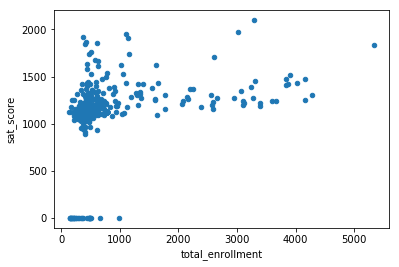

In [199]:
%matplotlib inline
print("\n===========================\n" + "TOTAL ENROLLMENT VS SAT SCORE" + "\n===========================")
full.plot.scatter(x='total_enrollment', y='sat_score')

In [201]:
# GET TOTAL ENROLLMENT < 1000
print("\n===========================\n" + "SCHOOLS : ENROLLMENT < 1000" + "\n===========================")
full[full["total_enrollment"] < 1000]["School Name"]


ENROLLMENT < 1000


0      HENRY STREET SCHOOL FOR INTERNATIONAL
1                 EAST SIDE COMMUNITY SCHOOL
3      PROFESSIONAL PERFORMING ARTS HIGH SCH
4             LIFE SCIENCES SECONDARY SCHOOL
5      WADLEIGH SECONDARY SCHOOL FOR THE PER
6                                        NaN
7      FREDERICK DOUGLASS ACADEMY II SECONDA
8                                        NaN
9            YOUNG WOMEN'S LEADERSHIP SCHOOL
10           YOUNG WOMEN'S LEADERSHIP SCHOOL
11                                       NaN
12                                       NaN
14     THURGOOD MARSHALL ACADEMY FOR LEARNIN
15                                       NaN
16                                       NaN
17                                       NaN
18     SOUTH BRONX PREPARATORY: A COLLEGE BO
19                                       NaN
20         HOSTOS-LINCOLN ACADEMY OF SCIENCE
21                  BRONX ACADEMY OF LETTERS
22                                       NaN
23                                       NaN
24        

In [202]:
# GET TOTAL SAT SCORE < 1000
print("\n===========================\n" + "SCHOOLS : SAT SCORE < 1000" + "\n===========================")
full[full["sat_score"] < 1000]["School Name"]


SCHOOLS : SAT SCORE < 1000


11                                       NaN
22                                       NaN
23                                       NaN
26                                       NaN
34     INTERNATIONAL SCHOOL FOR LIBERAL ARTS
42                                       NaN
59                                       NaN
60                                       NaN
72                                       NaN
77                                       NaN
96                                       NaN
97                                       NaN
98                                       NaN
108                                      NaN
109                                      NaN
110                                      NaN
132                                      NaN
133                                      NaN
134                                      NaN
148                                      NaN
155      INTERNATIONAL COMMUNITY HIGH SCHOOL
171                                      NaN
182       

In [203]:
# GET TOTAL ENROLLMENT < 1000
print("\n===========================\n" + "SCHOOLS : ENROLLMENT < 1000 & ENROLLMENT < 1000" + "\n===========================")
full[(full["total_enrollment"] < 1000) & (full["sat_score"] < 1000)]["School Name"]


SCHOOLS : ENROLLMENT < 1000 & ENROLLMENT < 1000


11                                       NaN
22                                       NaN
23                                       NaN
26                                       NaN
34     INTERNATIONAL SCHOOL FOR LIBERAL ARTS
42                                       NaN
59                                       NaN
60                                       NaN
72                                       NaN
77                                       NaN
96                                       NaN
97                                       NaN
98                                       NaN
108                                      NaN
109                                      NaN
110                                      NaN
132                                      NaN
133                                      NaN
134                                      NaN
148                                      NaN
155      INTERNATIONAL COMMUNITY HIGH SCHOOL
171                                      NaN
182       

# ENGLISH LANGUAGE LEARNERS AND SAT SCORE


ENGLISH LEARNERS VS SAT SCORE


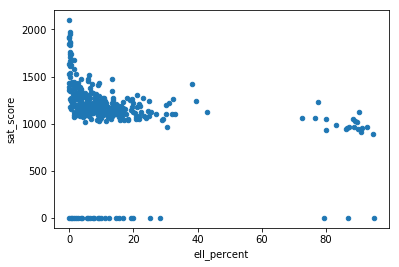

In [208]:
print("\n===========================\n" + "ENGLISH LEARNERS VS SAT SCORE" + "\n===========================")
full.plot.scatter(x='ell_percent', y='sat_score')

In [215]:
print("\n===========================\n" + "ENGLISH LEARNERS % BY DISTRICT" + "\n===========================")
show_district_map("ell_percent")


ENGLISH LEARNERS % BY DISTRICT


# SURVEY SCORE AND SAT SCORES


SURVEY SCORE AND SAT SCORE


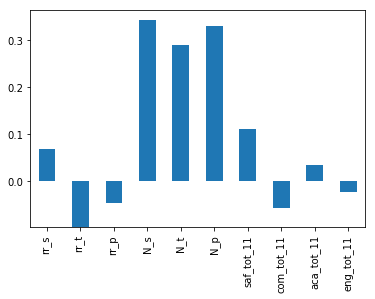

In [209]:
print("\n===========================\n" + "SURVEY SCORE AND SAT SCORE" + "\n===========================")
full.corr()["sat_score"][["rr_s", "rr_t", "rr_p", "N_s", "N_t", "N_p", "saf_tot_11", "com_tot_11", "aca_tot_11", "eng_tot_11"]].plot.bar()

# RACE AND SAT SCORE


RACE VS SAT SCORE


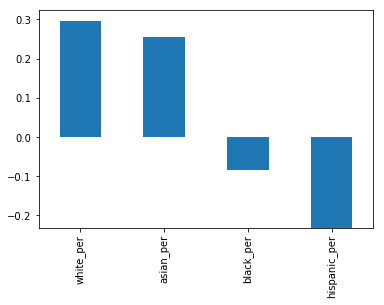

In [210]:
print("\n===========================\n" + "RACE VS SAT SCORE" + "\n===========================")
full.corr()["sat_score"][["white_per", "asian_per", "black_per", "hispanic_per"]].plot.bar()

# GENDER DIFFERENCE AND SAT SCORE


GENDER DIFFERENCE VS SAT SCORE


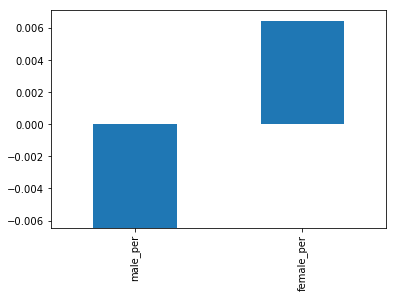

In [211]:
print("\n===========================\n" + "GENDER DIFFERENCE VS SAT SCORE" + "\n===========================")
full.corr()['sat_score'][['male_per','female_per']].plot.bar()


PERCENTAGE OF FEMALES VS SAT SCORE


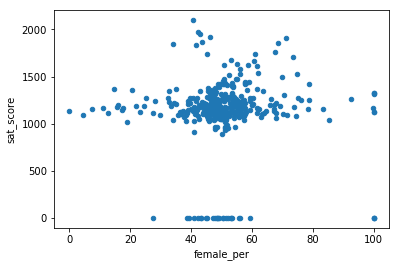

In [219]:
print("\n===========================\n" + "PERCENTAGE OF FEMALES VS SAT SCORE" + "\n===========================")
full.plot.scatter(x='female_per', y='sat_score')

In [220]:
print("\n===========================\n" + "SCHOOLS HAVING 65% OR MORE FEMALES" + "\n===========================")
full[full["female_per"] > 60]["School Name"]


SCHOOLS HAVING 65% OR MORE FEMALES


3                  PROFESSIONAL PERFORMING ARTS HIGH SCH
5                  WADLEIGH SECONDARY SCHOOL FOR THE PER
9                        YOUNG WOMEN'S LEADERSHIP SCHOOL
10                       YOUNG WOMEN'S LEADERSHIP SCHOOL
15                                                   NaN
32                 THEATRE ARTS PRODUCTION COMPANY SCHOO
41                 DR. SUSAN S. MCKINNEY SECONDARY SCHOO
42                                                   NaN
45                                                   NaN
59                                                   NaN
62                              BROOKLYN COLLEGE ACADEMY
64                      TEACHERS PREPARATORY HIGH SCHOOL
73                 QUEENS GATEWAY TO HEALTH SCIENCES SEC
74                                                   NaN
77                                                   NaN
83                        BARD HIGH SCHOOL EARLY COLLEGE
87                 HIGH SCHOOL OF HOSPITALITY MANAGEMENT
92                          LOW

In [223]:
print("\n===========================\n" + "SCHOOLS HAVING 1350 OR MORE SAT" + "\n===========================")
full[full["sat_score"] > 1350]["School Name"]


SCHOOLS HAVING 1350 OR MORE SAT


2             NEW EXPLORATIONS INTO SCIENCE  TECHNO
3             PROFESSIONAL PERFORMING ARTS HIGH SCH
13                       FREDERICK DOUGLASS ACADEMY
56            SCIENCE  TECHNOLOGY AND RESEARCH EARL
57            MEDGAR EVERS COLLEGE PREPARATORY SCHO
62                         BROOKLYN COLLEGE ACADEMY
66                                              NaN
68            WORLD JOURNALISM PREPARATORY: A COLLE
71                                              NaN
73            QUEENS GATEWAY TO HEALTH SCIENCES SEC
78            BACCALAUREATE SCHOOL FOR GLOBAL EDUCA
79                   THE MICHAEL J. PETRIDES SCHOOL
83                   BARD HIGH SCHOOL EARLY COLLEGE
95                                              NaN
99            HIGH SCHOOL FOR ENVIRONMENTAL STUDIES
100               BARUCH COLLEGE CAMPUS HIGH SCHOOL
101           N.Y.C. LAB SCHOOL FOR COLLABORATIVE S
102                            N.Y.C. MUSEUM SCHOOL
103                   ELEANOR ROOSEVELT HIGH SCHOOL
104         

In [224]:
print("\n===========================\n" + "SCHOOLS HAVING 65% OR MORE FEMALES AND SAT SCORE OF 1350+" + "\n===========================")
full[(full["female_per"] > 65) & (full["sat_score"] > 1350)]["School Name"]


SCHOOLS HAVING 65% OR MORE FEMALES AND SAT SCORE OF 1350+


3             PROFESSIONAL PERFORMING ARTS HIGH SCH
83                   BARD HIGH SCHOOL EARLY COLLEGE
103                   ELEANOR ROOSEVELT HIGH SCHOOL
117                    TALENT UNLIMITED HIGH SCHOOL
136            FIORELLO H. LAGUARDIA HIGH SCHOOL OF
321                     TOWNSEND HARRIS HIGH SCHOOL
352    FRANK SINATRA SCHOOL OF THE ARTS HIGH SCHOOL
Name: School Name, dtype: object

# Advance Plaement Exams


AVERAGE AP VS SAT SCORE


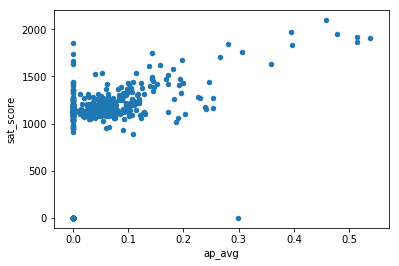

In [226]:
full["ap_avg"] = full["AP Test Takers "] / full["total_enrollment"]
print("\n===========================\n" + "AVERAGE AP VS SAT SCORE" + "\n===========================")
full.plot.scatter(x='ap_avg', y='sat_score')


In [227]:
print("\n===========================\n" + "SCHOOLS WITH SAT > 1500 and AVERAGE AP > .3" + "\n===========================")
full[(full["ap_avg"] > .3) & (full["sat_score"] > 1500)]["School Name"]


SCHOOLS WITH SAT > 1500 and AVERAGE AP > .3


103            ELEANOR ROOSEVELT HIGH SCHOOL
114                   STUYVESANT HIGH SCHOOL
200             BRONX HIGH SCHOOL OF SCIENCE
204    HIGH SCHOOL OF AMERICAN STUDIES AT LE
232           BROOKLYN TECHNICAL HIGH SCHOOL
304    LEON M. GOLDSTEIN HIGH SCHOOL FOR THE
321              TOWNSEND HARRIS HIGH SCHOOL
341    QUEENS HIGH SCHOOL FOR THE SCIENCES A
364      STATEN ISLAND TECHNICAL HIGH SCHOOL
Name: School Name, dtype: object